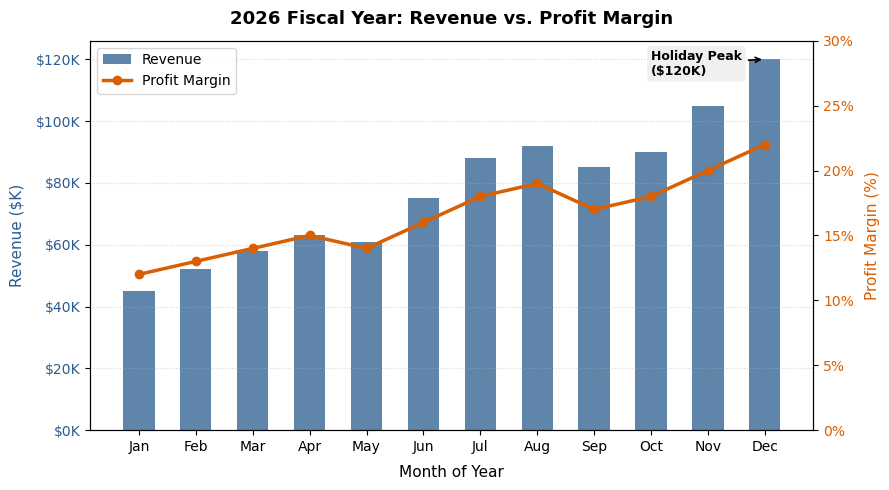

In [10]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np

# Synthetic sales & profit data over 12 months
np.random.seed(42)
months = np.arange(1, 13)
revenue = np.array([45, 52, 58, 63, 61, 75, 88, 92, 85, 90, 105, 120])
margin_pct = np.array([12, 13, 14, 15, 14, 16, 18, 19, 17, 18, 20, 22])

fig, ax1 = plt.subplots(figsize=(9, 5), dpi=100)

# Primary axis: Bar chart for revenue
color_rev = "#2b5c8f"
bars = ax1.bar(months, revenue, color=color_rev, alpha=0.75, width=0.55, label="Revenue")
ax1.set_xlabel("Month of Year", fontsize=11, labelpad=8)
ax1.set_ylabel("Revenue ($K)", color=color_rev, fontsize=11, labelpad=8)
ax1.tick_params(axis="y", labelcolor=color_rev)
ax1.yaxis.set_major_formatter(ticker.StrMethodFormatter("${x:,.0f}K"))
ax1.set_xticks(months)
ax1.set_xticklabels(["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])
ax1.grid(axis="y", linestyle=":", alpha=0.5)

# Secondary twin axis: Line chart for profit margin
ax2 = ax1.twinx()
color_margin = "#d95f02"
line = ax2.plot(months, margin_pct, color=color_margin, marker="o", linewidth=2.5, label="Profit Margin")
ax2.set_ylabel("Profit Margin (%)", color=color_margin, fontsize=11, labelpad=8)
ax2.tick_params(axis="y", labelcolor=color_margin)
ax2.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=100, decimals=0))
ax2.set_ylim(0, 30)

# Annotation pointing to Q4 peak
ax1.annotate(
    "Holiday Peak\n($120K)",
    xy=(12, 120),
    xytext=(10, 115),
    arrowprops=dict(arrowstyle="->", color="black", lw=1.2),
    fontsize=9,
    fontweight="semibold",
    bbox=dict(boxstyle="round,pad=0.3", fc="#f0f0f0", ec="none")
)

# Combined legend and title
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc="upper left", frameon=True)
ax1.set_title("2026 Fiscal Year: Revenue vs. Profit Margin", fontsize=13, fontweight="bold", pad=12)

plt.tight_layout()
plt.show()

In [8]:
plt.figure(figsize=(8, 5)) sns.histplot(df['total_bill'], bins=10, kde=True, color='skyblue') plt.title("Distribution of Total Bill") plt.xlabel("Total Bill ($)")

SyntaxError: invalid syntax (2457430849.py, line 1)

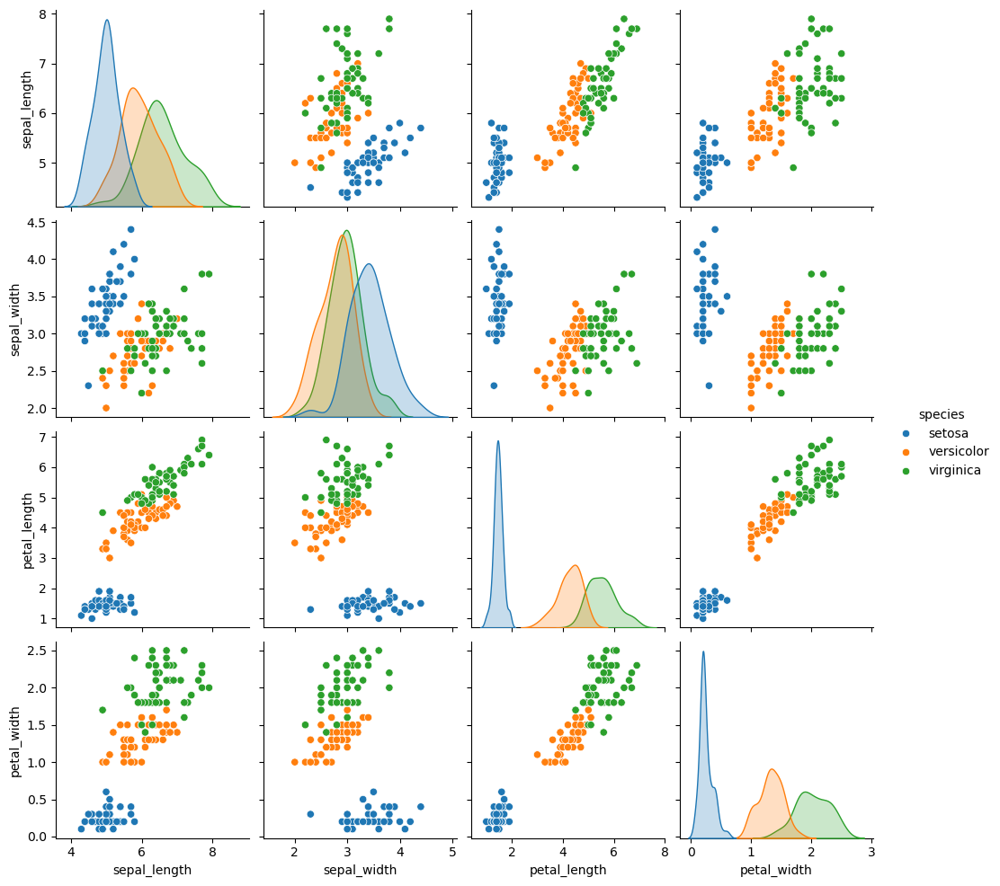

In [5]:
import seaborn as sns

# Load Iris dataset
iris_df = sns.load_dataset('iris')

# Visualize using pairplot
sns.pairplot(iris_df, hue='species')

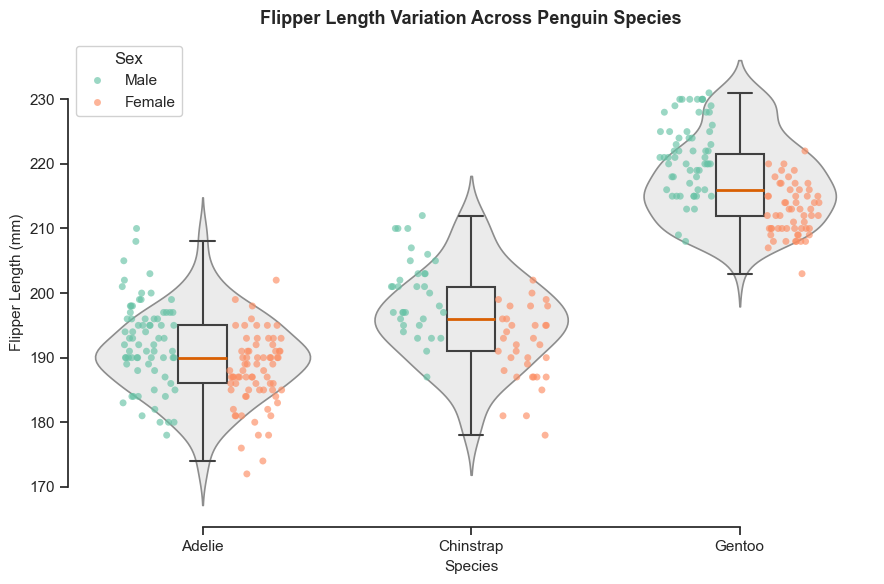

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

penguins = sns.load_dataset("penguins").dropna()

plt.figure(figsize=(9, 6), dpi=100)
sns.set_theme(style="ticks", palette="Set2")

# Layer 1: Violin Plot showing Kernel Density Estimate (split=False, no inner lines)
sns.violinplot(
    data=penguins,
    x="species",
    y="flipper_length_mm",
    inner=None,
    color=".92",
    linewidth=1.2
)

# Layer 2: Narrow Boxplot showing median and IQR
sns.boxplot(
    data=penguins,
    x="species",
    y="flipper_length_mm",
    width=0.18,
    boxprops=dict(facecolor="none", edgecolor=".25", linewidth=1.5),
    whiskerprops=dict(color=".25", linewidth=1.5),
    medianprops=dict(color="#d95f02", linewidth=2),
    capprops=dict(color=".25", linewidth=1.5),
    showcaps=True,
    showfliers=False
)

# Layer 3: Strip plot showing individual observations with jitter and hue separation
sns.stripplot(
    data=penguins,
    x="species",
    y="flipper_length_mm",
    hue="sex",
    dodge=True,
    jitter=0.2,
    alpha=0.65,
    size=5
)

plt.title("Flipper Length Variation Across Penguin Species", fontsize=13, fontweight="bold", pad=10)
plt.xlabel("Species", fontsize=11)
plt.ylabel("Flipper Length (mm)", fontsize=11)
plt.legend(title="Sex", loc="upper left", framealpha=0.9)
sns.despine(trim=True)

plt.tight_layout()
plt.show()

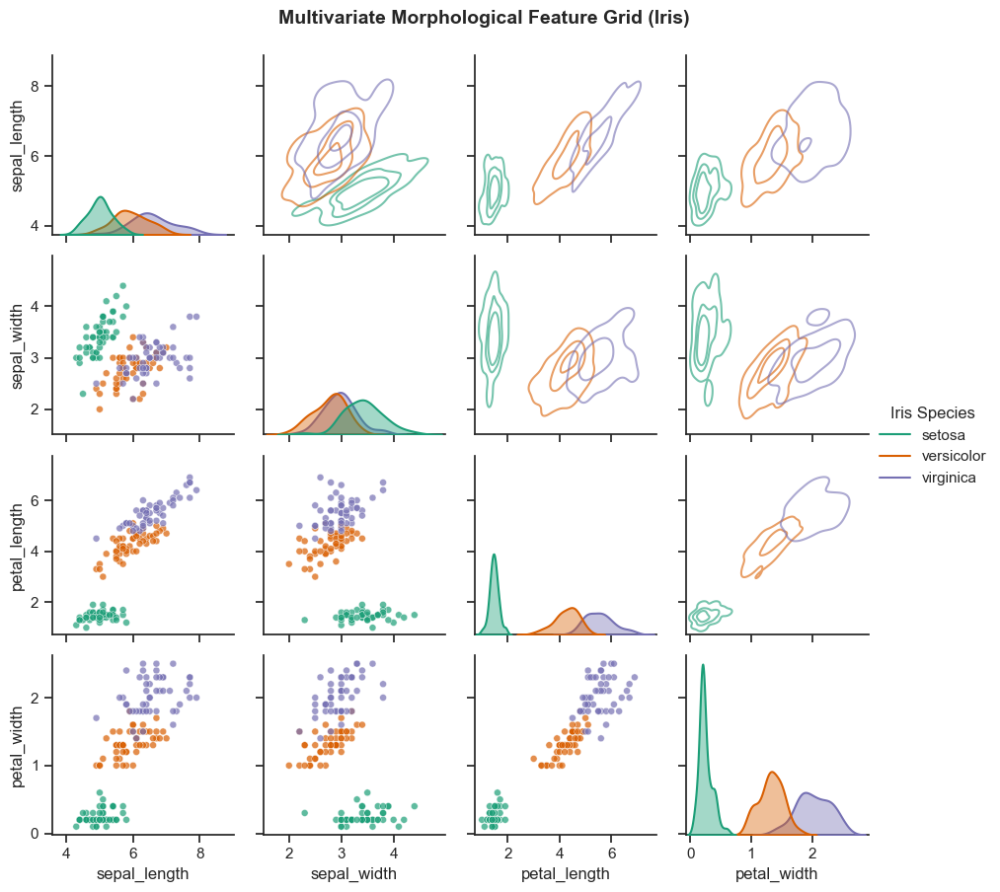

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

iris = sns.load_dataset("iris")

# PairGrid setup with categorical hue
g = sns.PairGrid(iris, hue="species", palette="Dark2", corner=False, height=2.3)

# 1. Diagonal: Kernel Density Estimation for distribution of each variable
g.map_diag(sns.kdeplot, fill=True, alpha=0.4, linewidth=1.5)

# 2. Lower Triangle: Scatter plots with alpha transparency to reveal clustering
g.map_lower(sns.scatterplot, alpha=0.7, s=25)

# 3. Upper Triangle: 2D bivariate density contours
g.map_upper(sns.kdeplot, levels=4, alpha=0.6)

g.add_legend(title="Iris Species", adjust_subtitles=True)
g.figure.subplots_adjust(top=0.93)
g.figure.suptitle("Multivariate Morphological Feature Grid (Iris)", fontsize=14, fontweight="bold")

plt.show()

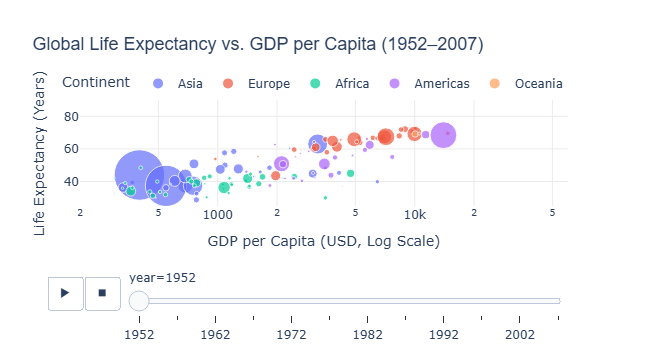

In [13]:
import plotly.express as px

# Built-in multi-year global development dataset
gapminder = px.data.gapminder()

fig = px.scatter(
    gapminder,
    x="gdpPercap",
    y="lifeExp",
    animation_frame="year",
    animation_group="country",
    size="pop",
    color="continent",
    hover_name="country",
    log_x=True,
    size_max=55,
    range_x=[200, 60000],
    range_y=[25, 90],
    labels={
        "gdpPercap": "GDP per Capita (USD, Log Scale)",
        "lifeExp": "Life Expectancy (Years)",
        "pop": "Population",
        "continent": "Continent"
    },
    title="Global Life Expectancy vs. GDP per Capita (1952–2007)",
    template="plotly_white"
)

# Refine axis parameters and hover presentation
fig.update_layout(
    title_font=dict(size=18, family="Arial"),
    xaxis=dict(showgrid=True, gridcolor="#ebebeb"),
    yaxis=dict(showgrid=True, gridcolor="#ebebeb"),
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
)

# Output interactive canvas
fig.show()

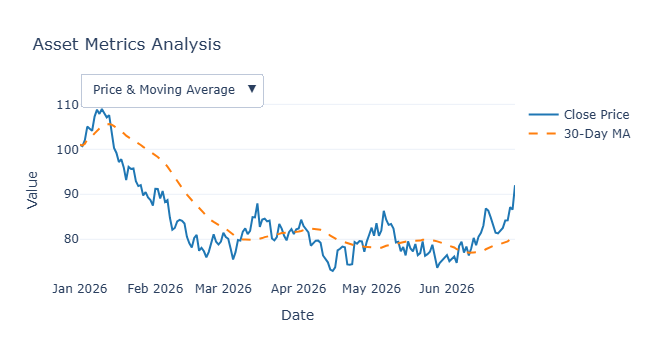

In [14]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np

# Generate synthetic time-series data
np.random.seed(42)
dates = pd.date_range("2026-01-01", periods=180)
price = 100 + np.cumsum(np.random.randn(180) * 2)
ma30 = pd.Series(price).rolling(window=30, min_periods=1).mean().values
volume = np.random.randint(1000, 5000, size=180)

fig = go.Figure()

# Trace 0: Closing Price
fig.add_trace(go.Scatter(x=dates, y=price, name="Close Price", line=dict(color="#1f77b4", width=2)))

# Trace 1: 30-Day Moving Average
fig.add_trace(go.Scatter(x=dates, y=ma30, name="30-Day MA", line=dict(color="#ff7f0e", dash="dash")))

# Trace 2: Volume (hidden initially)
fig.add_trace(go.Bar(x=dates, y=volume, name="Volume", marker_color="#2ca02c", visible=False))

# Define dropdown menus using the `restyle` method (toggles trace properties)
fig.update_layout(
    updatemenus=[
        dict(
            active=0,
            x=0.0,
            y=1.15,
            xanchor="left",
            yanchor="top",
            buttons=[
                dict(
                    label="Price & Moving Average",
                    method="restyle",
                    args=[{"visible": [True, True, False]}]  # Visibility for [Trace 0, Trace 1, Trace 2]
                ),
                dict(
                    label="Price Only",
                    method="restyle",
                    args=[{"visible": [True, False, False]}]
                ),
                dict(
                    label="Volume Only",
                    method="restyle",
                    args=[{"visible": [False, False, True]}]
                ),
                dict(
                    label="All Metrics",
                    method="restyle",
                    args=[{"visible": [True, True, True]}]
                )
            ]
        )
    ],
    title="Asset Metrics Analysis",
    template="plotly_white",
    xaxis=dict(title="Date"),
    yaxis=dict(title="Value")
)

fig.show()

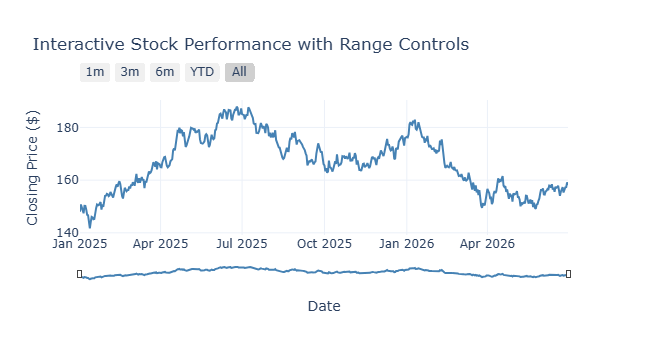

In [15]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np

# Generate continuous time-series
dates = pd.date_range("2025-01-01", "2026-06-30", freq="D")
values = 150 + np.cumsum(np.random.randn(len(dates)) * 1.5)

fig = go.Figure(data=go.Scatter(x=dates, y=values, mode="lines", line=dict(color="#4682b4")))

fig.update_layout(
    title="Interactive Stock Performance with Range Controls",
    template="plotly_white",
    xaxis=dict(
        title="Date",
        # 1. Range Selector Preset Buttons
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=3, label="3m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(step="all", label="All")
            ]),
            bgcolor="#f0f0f0",
            activecolor="#d0d0d0",
            y=1.1,
            x=0
        ),
        # 2. Bottom Overview Slider
        rangeslider=dict(
            visible=True,
            thickness=0.08  # Height fraction of canvas
        ),
        type="date"
    ),
    yaxis=dict(title="Closing Price ($)")
)

fig.show()

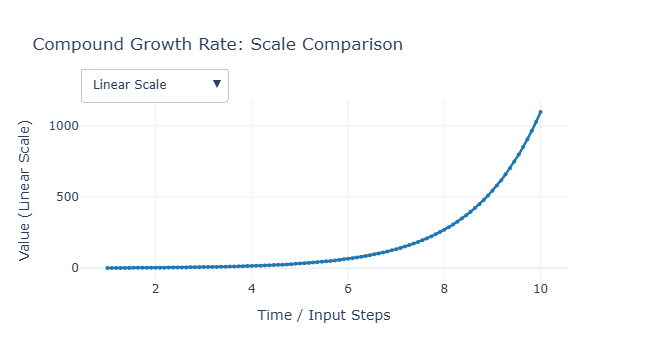

In [1]:
import plotly.graph_objects as go
import numpy as np

# Exponential growth data where log vs. linear comparison is critical
x = np.linspace(1, 10, 100)
y_exp = np.exp(x * 0.7)

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=x,
        y=y_exp,
        mode="lines+markers",
        name="Exponential Trajectory",
        line=dict(color="#1f77b4", width=2.5),
        marker=dict(size=4)
    )
)

fig.update_layout(
    title="Compound Growth Rate: Scale Comparison",
    template="plotly_white",
    xaxis=dict(title="Time / Input Steps"),
    yaxis=dict(
        title="Value (Linear Scale)",
        type="linear"  # Initial state
    ),
    updatemenus=[
        dict(
            type="dropdown",
            direction="down",
            x=0.0,
            y=1.18,
            xanchor="left",
            yanchor="top",
            active=0,
            buttons=[
                dict(
                    label="Linear Scale",
                    method="relayout",
                    args=[{
                        "yaxis.type": "linear",
                        "yaxis.title.text": "Value (Linear Scale)"
                    }]
                ),
                dict(
                    label="Logarithmic Scale",
                    method="relayout",
                    args=[{
                        "yaxis.type": "log",
                        "yaxis.title.text": "Value (Log Scale)"
                    }]
                )
            ]
        )
    ]
)

fig.show()

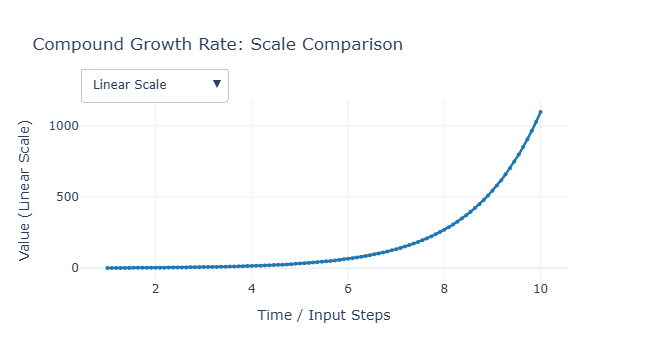

In [2]:
import plotly.graph_objects as go
import numpy as np

# Exponential growth data where log vs. linear comparison is critical
x = np.linspace(1, 10, 100)
y_exp = np.exp(x * 0.7)

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=x,
        y=y_exp,
        mode="lines+markers",
        name="Exponential Trajectory",
        line=dict(color="#1f77b4", width=2.5),
        marker=dict(size=4)
    )
)

fig.update_layout(
    title="Compound Growth Rate: Scale Comparison",
    template="plotly_white",
    xaxis=dict(title="Time / Input Steps"),
    yaxis=dict(
        title="Value (Linear Scale)",
        type="linear"  # Initial state
    ),
    updatemenus=[
        dict(
            type="dropdown",
            direction="down",
            x=0.0,
            y=1.18,
            xanchor="left",
            yanchor="top",
            active=0,
            buttons=[
                dict(
                    label="Linear Scale",
                    method="relayout",
                    args=[{
                        "yaxis.type": "linear",
                        "yaxis.title.text": "Value (Linear Scale)"
                    }]
                ),
                dict(
                    label="Logarithmic Scale",
                    method="relayout",
                    args=[{
                        "yaxis.type": "log",
                        "yaxis.title.text": "Value (Log Scale)"
                    }]
                )
            ]
        )
    ]
)

fig.show()

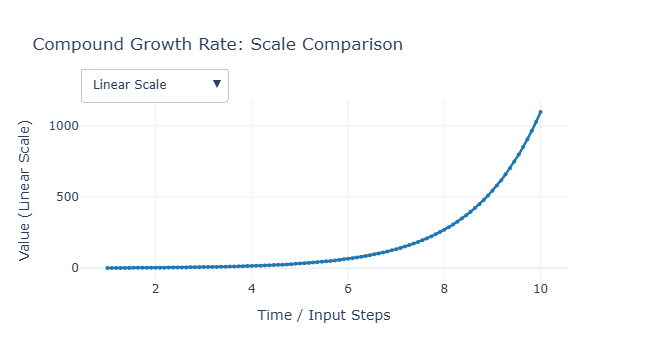

In [3]:
import plotly.graph_objects as go
import numpy as np

# Exponential growth data where log vs. linear comparison is critical
x = np.linspace(1, 10, 100)
y_exp = np.exp(x * 0.7)

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=x,
        y=y_exp,
        mode="lines+markers",
        name="Exponential Trajectory",
        line=dict(color="#1f77b4", width=2.5),
        marker=dict(size=4)
    )
)

fig.update_layout(
    title="Compound Growth Rate: Scale Comparison",
    template="plotly_white",
    xaxis=dict(title="Time / Input Steps"),
    yaxis=dict(
        title="Value (Linear Scale)",
        type="linear"  # Initial state
    ),
    updatemenus=[
        dict(
            type="dropdown",
            direction="down",
            x=0.0,
            y=1.18,
            xanchor="left",
            yanchor="top",
            active=0,
            buttons=[
                dict(
                    label="Linear Scale",
                    method="relayout",
                    args=[{
                        "yaxis.type": "linear",
                        "yaxis.title.text": "Value (Linear Scale)"
                    }]
                ),
                dict(
                    label="Logarithmic Scale",
                    method="relayout",
                    args=[{
                        "yaxis.type": "log",
                        "yaxis.title.text": "Value (Log Scale)"
                    }]
                )
            ]
        )
    ]
)

fig.show()

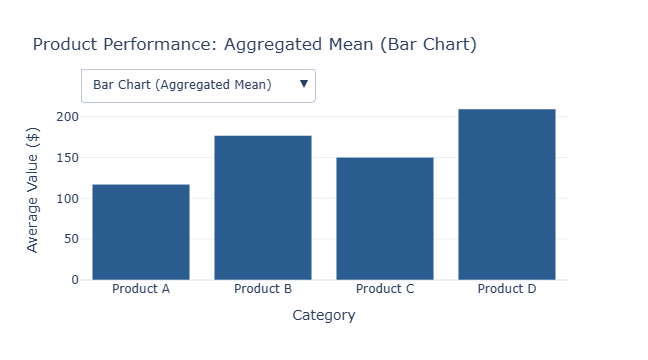

In [4]:
import plotly.graph_objects as go
import numpy as np

# Sample categorical data
categories = ["Product A", "Product B", "Product C", "Product D"]

# Repeated samples per category for distribution visuals (Box / Scatter)
np.random.seed(42)
cat_repeated = np.repeat(categories, 30)
values = np.concatenate([
    np.random.normal(loc=120, scale=15, size=30),
    np.random.normal(loc=180, scale=25, size=30),
    np.random.normal(loc=150, scale=20, size=30),
    np.random.normal(loc=210, scale=30, size=30),
])

# Pre-aggregated mean for the Bar chart
mean_values = [values[cat_repeated == c].mean() for c in categories]

fig = go.Figure()

# Trace 0: Bar Chart (Visible by default)
fig.add_trace(
    go.Bar(
        x=categories,
        y=mean_values,
        name="Mean Performance",
        marker_color="#2b5c8f",
        visible=True
    )
)

# Trace 1: Scatter (Strip-style distribution, Hidden by default)
fig.add_trace(
    go.Scatter(
        x=cat_repeated,
        y=values,
        mode="markers",
        name="Individual Data Points",
        marker=dict(size=7, color="#e7298a", opacity=0.7),
        visible=False
    )
)

# Trace 2: Box Plot (Hidden by default)
fig.add_trace(
    go.Box(
        x=cat_repeated,
        y=values,
        name="Distribution Summary",
        marker_color="#33a02c",
        boxmean=True,
        visible=False
    )
)

# Dropdown menu configuration using method="update"
fig.update_layout(
    updatemenus=[
        dict(
            type="dropdown",
            direction="down",
            x=0.0,
            y=1.18,
            xanchor="left",
            yanchor="top",
            active=0,
            buttons=[
                dict(
                    label="Bar Chart (Aggregated Mean)",
                    method="update",
                    args=[
                        {"visible": [True, False, False]},  # [Bar, Scatter, Box]
                        {"title": "Product Performance: Aggregated Mean (Bar Chart)",
                         "yaxis.title.text": "Average Value ($)"}
                    ]
                ),
                dict(
                    label="Scatter Plot (Raw Observations)",
                    method="update",
                    args=[
                        {"visible": [False, True, False]},
                        {"title": "Product Performance: Raw Observations (Scatter Plot)",
                         "yaxis.title.text": "Individual Value ($)"}
                    ]
                ),
                dict(
                    label="Box Plot (IQR & Quartiles)",
                    method="update",
                    args=[
                        {"visible": [False, False, True]},
                        {"title": "Product Performance: Distribution & Spread (Box Plot)",
                         "yaxis.title.text": "Value Spread ($)"}
                    ]
                )
            ]
        )
    ],
    title="Product Performance: Aggregated Mean (Bar Chart)",
    template="plotly_white",
    xaxis=dict(title="Category"),
    yaxis=dict(title="Average Value ($)"),
    showlegend=False
)

fig.show()

In [6]:
import plotly.express as px

df = px.data.iris()
fig = px.scatter(df, x="sepal_width", y="sepal_length", color="species", title="Iris Dataset")

# Option A: CDN-linked (Smallest file size: ~50 KB)
# Requires an active internet connection to load the Plotly JS runtime
fig.write_html("chart_cdn.html", include_plotlyjs="cdn")

# Option B: Fully offline standalone (File size: ~3.5 MB)
# Embeds the complete Plotly JavaScript engine directly inside the HTML
fig.write_html("chart_offline.html", include_plotlyjs=True)

In [8]:
# Returns an HTML string snippet instead of writing to a file
html_snippet = fig.to_html(
    full_html=False,
    include_plotlyjs=False  # Assumes Plotly JS is already loaded in your site's <head>
)

# Example: Save snippet or pass to a web template engine
with open("chart_snippet.html", "w") as f:
    f.write(html_snippet)